In [1]:
from ReportPretraining import ReportPretraining, ReportZeroshot
from src.layers.transformer.lightcurve import LightCurveTransformer
from src.layers.transformer.tabular import TabularTransformer
import pandas as pd
import umap.plot
from src.layers.classifiers.MultimodalClassifier import MultimodalClassifier
from src.utils.data.AlerceDictionaries import ELASTICC_TAXONOMY,ZTF_TAXONOMY

/home/mdelafuente/miniconda3/envs/ATAT/lib/python3.12/site-packages/numba/np/ufunc/dufunc.py:343: NumbaWarning: Compilation requested for previously compiled argument types ((uint32,)). This has no effect and perhaps indicates a bug in the calling code (compiling a ufunc more than once for the same signature
  warnings.warn(msg, errors.NumbaWarning)
/home/mdelafuente/miniconda3/envs/ATAT/lib/python3.12/site-packages/numba/np/ufunc/dufunc.py:343: NumbaWarning: Compilation requested for previously compiled argument types ((uint32,)). This has no effect and perhaps indicates a bug in the calling code (compiling a ufunc more than once for the same signature
  warnings.warn(msg, errors.NumbaWarning)
/home/mdelafuente/miniconda3/envs/ATAT/lib/python3.12/site-packages/numba/np/ufunc/dufunc.py:343: NumbaWarning: Compilation requested for previously compiled argument types ((uint32,)). This has no effect and perhaps indicates a bug in the calling code (compiling a ufunc more than once for the s

In [2]:
PATH = '/home/mdelafuente/pipeline/pipeline/training/lc_classifier_ztf/ATAT_ALeRCE/results/AUGS/LC_MD/test_0/'

In [3]:
from ReportPretraining import InitBackbone,InitDataLoader, UMAPExplorer, InitClassifier
from src.layers.transformer.Combinator import Combinator

lc = InitBackbone(path_to_config_yaml=PATH, 
                    model= LightCurveTransformer, 
                    arg_key='lc')
od = lc.create_ordered_dict(remove_if_in_key_list=['projection', 'transformer_tab', 'classifier'],rename_keys = ('model.transformer_lc.',''), checkpoint_name='pretrain_ckpt')
lc.load_backbone_weights(od)

Found checkpoint 244.ckpt
Loaded backbone weights


/home/mdelafuente/miniconda3/envs/ATAT/lib/python3.12/site-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/home/mdelafuente/pipeline/pipeline/training/lc_classifier_ztf/ATAT_ALeRCE/ReportPretraining.py:111: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_g

In [4]:
from ReportPretraining import InitBackbone,InitDataLoader, UMAPExplorer, InitClassifier
tab = InitBackbone(path_to_config_yaml=PATH, 
                    model= TabularTransformer, 
                    arg_key='tab')
od = tab.create_ordered_dict(remove_if_in_key_list=['projection', 'transformer_lc', 'classifier'],rename_keys = ('model.transformer_tab.',''), checkpoint_name='pretrain_ckpt')
tab.load_backbone_weights(od)

Found checkpoint 244.ckpt
Loaded backbone weights


In [5]:

model  = Combinator(lc,tab)

In [6]:
asdfadsf

NameError: name 'asdfadsf' is not defined

In [7]:
FP_DATASET = "/home/mdelafuente/pipeline/pipeline/training/lc_classifier_ztf/ATAT_ALeRCE/data/datasets/ZTF_ff/final/LC_MD_FEAT_240627_windows_200_12/dataset.h5"
dl = InitDataLoader(update_dataset_path=FP_DATASET,update_batch_size=256,datamodule_args=lc.args.datamodule)

/home/mdelafuente/miniconda3/envs/ATAT/lib/python3.12/site-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator QuantileTransformer from version 1.5.0 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/home/mdelafuente/miniconda3/envs/ATAT/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but QuantileTransformer was fitted with feature names
  warnings.warn(
/home/mdelafuente/miniconda3/envs/ATAT/lib/python3.12/site-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator QuantileTransformer from version 1.5.0 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/mo

notusingsampler
tensor([0.0003, 0.0003, 0.0003,  ..., 0.0006, 0.0006, 0.0006],
       dtype=torch.float64)


/home/mdelafuente/miniconda3/envs/ATAT/lib/python3.12/site-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator QuantileTransformer from version 1.5.0 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/home/mdelafuente/miniconda3/envs/ATAT/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but QuantileTransformer was fitted with feature names
  warnings.warn(


In [8]:
umap_tool = UMAPExplorer(model, dl, ZTF_TAXONOMY)
hover_data, mapper, preds_out,target= umap_tool.umap_mapper(device = 'cuda:0', umap_args={'min_dist':0.1})

Loading BokehJS ...

TypeError: Combinator.predict() missing 2 required positional arguments: 'time' and 'mask'

In [ ]:
umap.plot.output_notebook()

Loading BokehJS ...

In [ ]:
colors = [
    #,'#554FCF'
    
    '#FBAC23', #agn 0
    '#D747CF', #qso 1
    '#F68128', # EA 2

    '#F25A2C', #yso 3
    '#0CE9C0',  # snia 4
    '#ED3731', # cvnova 5
    '#8954C9',# 6 rrlc 
    '#554FCF',  # 7 rscvn
    '#96034A', #blacar 8
    '#2845E6', # snii 9 
    '#351FFF', # ebew 10
    '#1D2996', #lpv 11
    '#1F78FF', # cep 12
    '#1FCEFF', # rrlab 13
    '#1FA9FF', # periodic other 14
    '#BE4BD2', #dsct 15
    '#0CCA55', # snibc 16
    '#2F8B04', # slsn 17
    '#84FF1F', # tde 18
    '#FFC71F', # sniib 19
    '#FFEC1F', # sniin 20
    '#FFEC1F', # microlensing 21
    ]

<Axes: >

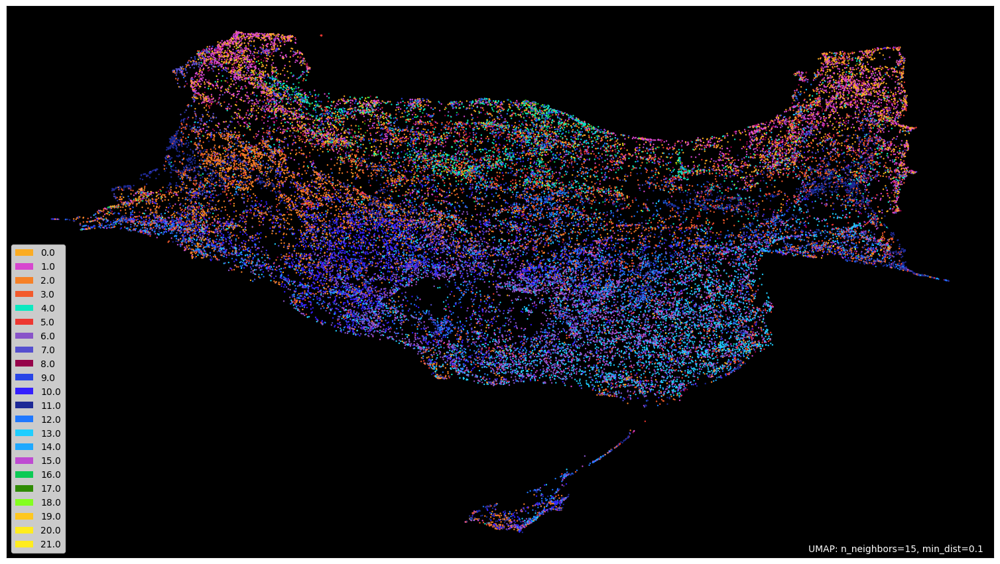

In [ ]:
umap.plot.points(mapper, labels = target,color_key = colors,width = 1920, height = 1080, background = 'black')

In [ ]:
#from bokeh.resources import INLINE
#import bokeh.io
#from bokeh import *
#bokeh.io.output_notebook(INLINE)
p = umap.plot.interactive(mapper, 
        labels=target,
        hover_data=hover_data,
        point_size=2,
        tools=["pan","wheel_zoom",
               "box_zoom","save",
               "reset","box_select"],
        width=1920,
        height=1080,
        theme = 'fire',
        color_key = colors,
        alpha = 1)
umap.plot.show(p)

In [ ]:
asdfadsf

NameError: name 'asdfadsf' is not defined

In [ ]:
hover_data['total_count'] = hover_data['band_0_count'] + hover_data['band_1_count']

In [ ]:
import numpy as np
hover_data['total_count_round'] = np.round(hover_data['total_count'].values, -1)

In [ ]:
def map_label_tensor(labels):
    mapping_dict = {
        0: 1, 1: 1, 3: 1, 5: 1, 8: 1,
        2: 2, 6: 2, 7: 2, 10: 2, 11: 2, 12: 2, 13: 2, 14: 2, 15: 2,
        4: 0, 9: 0, 16: 0, 17: 0, 18: 0, 19: 0, 20: 0, 21: 0
    }
    mapping_tensor = np.array([mapping_dict.get(int(label), -1) for label in labels])
    return mapping_tensor

hier_target= map_label_tensor(target)
hover_data['hier_class'] = hier_target


In [ ]:
hover_data

,index,label,band_0_count,band_1_count,item,total_count,total_count_round,hier_class
0,0,10.0,73,98,EB/EW,171,170,2
1,1,10.0,85,103,EB/EW,188,190,2
2,2,10.0,82,118,EB/EW,200,200,2
3,3,10.0,102,97,EB/EW,199,200,2
4,4,10.0,75,110,EB/EW,185,180,2
...,...,...,...,...,...,...,...,...
40693,40693,4.0,59,131,SNIa,190,190,0
40694,40694,4.0,85,97,SNIa,182,180,0
40695,40695,4.0,55,131,SNIa,186,190,0
40696,40696,4.0,68,132,SNIa,200,200,0


In [ ]:
p = umap.plot.interactive(mapper, 
        labels=hover_data['hier_class'],
        hover_data=hover_data,
        point_size=3,
        tools=["pan","wheel_zoom",
               "box_zoom","save",
               "reset","box_select"],
        width=1920,
        height=1080,
        theme = 'fire',
        alpha = 1)
umap.plot.show(p)

<Axes: >

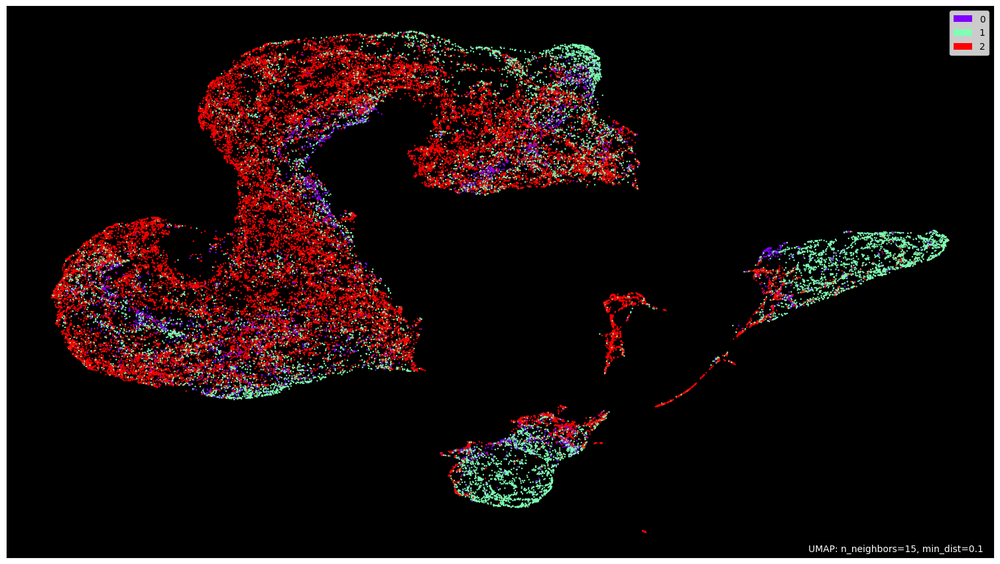

In [ ]:
umap.plot.points(mapper, labels=hover_data['hier_class'],width = 1920, height = 1080, theme = 'fire',background = 'black')

In [ ]:
#from bokeh.resources import INLINE
#import bokeh.io
#from bokeh import *
#bokeh.io.output_notebook(INLINE)
p = umap.plot.interactive(mapper, 
        labels=hover_data['total_count_round'],
        hover_data=hover_data,
        point_size=3,
        tools=["pan","wheel_zoom",
               "box_zoom","save",
               "reset","box_select"],
        width=1920,
        height=1080,
        theme = 'fire',
        alpha = 1)
umap.plot.show(p)


In [ ]:
asdf

NameError: name 'asdf' is not defined

In [ ]:
from sklearn.decomposition import PCA


In [ ]:
from sklearn.metrics import classification_report

from sklearn.linear_model import LogisticRegression
dl.set_sampler(False)
X_train, y_train =test.predict(dl.train_dataset, 'cuda:0')
X_test, y_test =test.predict(dl.validation_dataset, 'cuda:0')

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier

device set to cuda:0


100%|██████████| 632/632 [01:54<00:00,  5.50it/s]


device set to cuda:0


100%|██████████| 159/159 [00:28<00:00,  5.62it/s]


In [ ]:

std_pipeline = Pipeline([
    ('scaler', MinMaxScaler()),  # z = (x - mean) / std
    ('model', LogisticRegression(random_state=0, max_iter = 100, multi_class = 'ovr'))
])

# You can change n_neighbors as needed
std_pipeline.fit(X_train,y_train)
train_y_pred = std_pipeline.predict(X_train)

classification = classification_report(y_train,train_y_pred, target_names=list(ZTF_TAXONOMY().keys()),digits = 4)
print(classification)
test_y_pred = std_pipeline.predict(X_test)

classification = classification_report(y_test,test_y_pred, target_names=list(ZTF_TAXONOMY().keys()),digits = 4)
print(classification)

/home/mdelafuente/miniconda3/envs/ATAT/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/mdelafuente/miniconda3/envs/ATAT/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


                precision    recall  f1-score   support

           AGN     0.2641    0.1716    0.2080     12636
           QSO     0.4393    0.7090    0.5425     13847
            EA     0.4027    0.5614    0.4690     13978
           YSO     0.2745    0.1988    0.2306     10480
          SNIa     0.3126    0.4966    0.3837      6716
       CV/Nova     0.3682    0.1468    0.2099      6211
          RRLc     0.5009    0.5624    0.5298     13356
         RSCVn     0.3176    0.1826    0.2319      9886
        Blazar     0.0750    0.0005    0.0011      5647
          SNII     0.2576    0.0353    0.0621      3342
         EB/EW     0.4448    0.5908    0.5075     14682
           LPV     0.5331    0.6608    0.5901     13346
           CEP     0.3768    0.3789    0.3778     11202
         RRLab     0.4336    0.6433    0.5181     14075
Periodic-Other     0.1429    0.0032    0.0062      2827
          DSCT     0.2948    0.0646    0.1059      6442
         SNIbc     0.0000    0.0000    0.0000  

/home/mdelafuente/miniconda3/envs/ATAT/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/mdelafuente/miniconda3/envs/ATAT/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/mdelafuente/miniconda3/envs/ATAT/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

In [ ]:
knn_pipeline = Pipeline([
    
    ('scaler', StandardScaler()),  # z = (x - mean) / std
    #('pca', PCA()),
    ('model', KNeighborsClassifier(15,weights='distance'))
])

knn_pipeline.fit(X_train, y_train)
knn_preds = knn_pipeline.predict(X_test)

classification = classification_report(y_test,knn_preds, target_names=list(ZTF_TAXONOMY().keys()),digits = 4)
print(classification)

                precision    recall  f1-score   support

           AGN     0.4423    0.3823    0.4101      3288
           QSO     0.5171    0.6359    0.5704      3428
            EA     0.6138    0.5826    0.5978      3500
           YSO     0.4379    0.4236    0.4306      2715
          SNIa     0.3677    0.4771    0.4153      1639
       CV/Nova     0.6883    0.3933    0.5006      1617
          RRLc     0.5853    0.6496    0.6158      3439
         RSCVn     0.4825    0.5095    0.4957      2522
        Blazar     0.4858    0.2764    0.3523      1364
          SNII     0.3065    0.1995    0.2417       802
         EB/EW     0.5050    0.6688    0.5755      3635
           LPV     0.7399    0.6496    0.6918      3319
           CEP     0.5460    0.6423    0.5903      2871
         RRLab     0.5541    0.6299    0.5895      3507
Periodic-Other     0.5898    0.2345    0.3356       742
          DSCT     0.5336    0.4458    0.4857      1604
         SNIbc     0.3293    0.0863    0.1367  

/home/mdelafuente/miniconda3/envs/ATAT/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/mdelafuente/miniconda3/envs/ATAT/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/mdelafuente/miniconda3/envs/ATAT/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

/home/mdelafuente/miniconda3/envs/ATAT/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/mdelafuente/miniconda3/envs/ATAT/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/mdelafuente/miniconda3/envs/ATAT/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

<Axes: title={'center': 'ATAT dataset zero shot knn: val | macro f1: 0.3903'}, xlabel='Predicted label', ylabel='True label'>

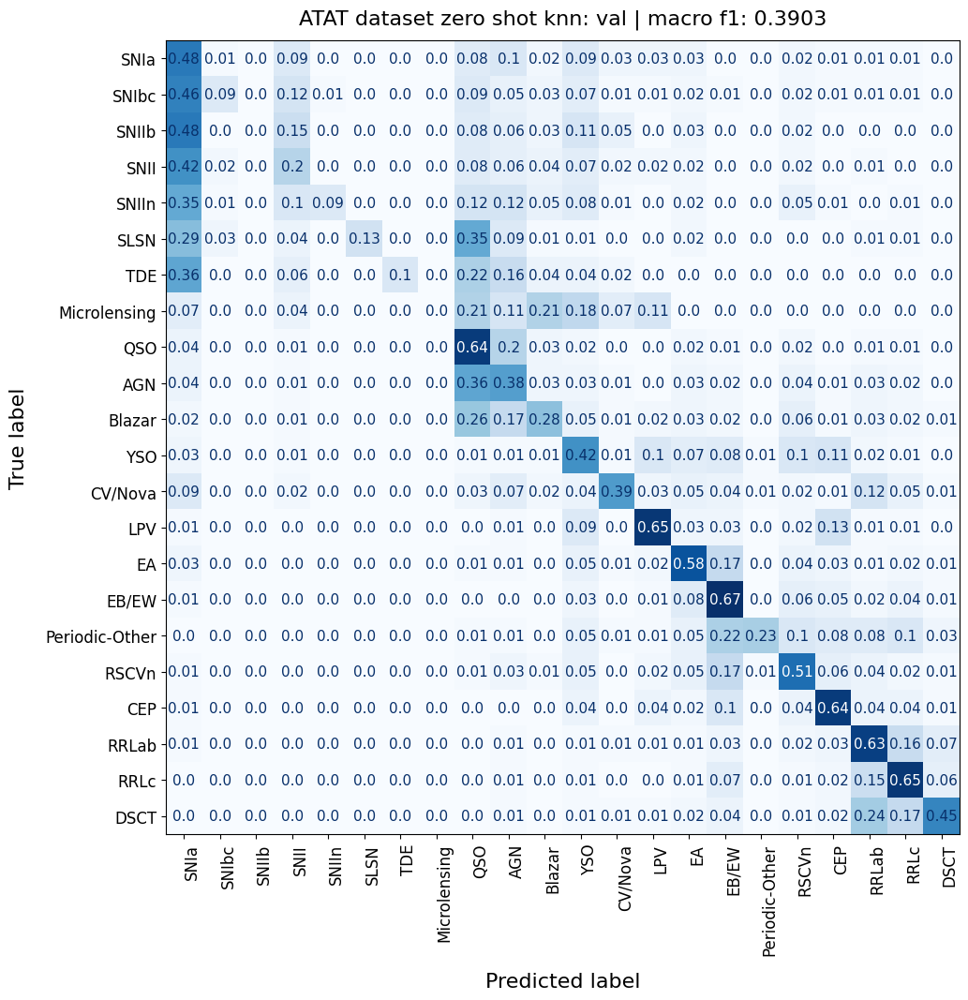

In [ ]:
import numpy as np
def get_confusion_matrix( preds,target,  dataset_type:str):
        from sklearn.metrics import classification_report
        import matplotlib.pyplot as plt
        order_classes = ['SNIa', # yes
                 'SNIbc', # yes
                 'SNIIb', # yes
                 'SNII', # yes
                 'SNIIn', # yes
                 'SLSN', # yes
                 'TDE', # yes
                 'Microlensing', # yes
                 'QSO', 
                 'AGN', # yes
                 'Blazar', 
                 'YSO', 
                 'CV/Nova', 
                 'LPV', 
                 'EA', 
                 'EB/EW', # yes
                 'Periodic-Other', 
                 'RSCVn', 
                 'CEP', 
                 'RRLab', 
                 'RRLc', 
                 'DSCT']
        from sklearn.metrics import confusion_matrix
        import matplotlib.pyplot as plt

        fs = 11
        y_true = [ZTF_TAXONOMY.values_as_keys()[i] for i in np.array(target).astype(int)]
        y_pred = [ZTF_TAXONOMY.values_as_keys()[i] for i in np.array(preds).astype(int)]

        cm = confusion_matrix(y_true=y_true, y_pred=y_pred, labels=order_classes, normalize='true')
        np.set_printoptions(precision=4, suppress=True)
        cmap = plt.cm.Blues
        fig, ax = plt.subplots(figsize=(11, 11)) #, dpi=110)
        decimals = 2
        im = ax.imshow(np.around(cm, decimals=decimals), interpolation='nearest', cmap=cmap)
        # color map
        new_color = cmap(1.0) 

        # Añadiendo manualmente las anotaciones con la media y desviación estándar
        for i in range(cm.shape[0]):
            for j in range(cm.shape[1]):
                if cm[i, j] >= 0.005:
                    #print(cm[i, j])
                    text = f'{np.around(cm[i, j], decimals=decimals)}'
                    color = "white" if cm[i, j] > 0.5 else new_color  # Blanco para la diagonal, tono de azul para otras celdas
                    ax.text(j, i, text, ha="center", va="center", color=color, fontsize=fs)
                else:
                    text = f'{np.around(cm[i, j], decimals=decimals)}'
                    color = "white" if cm[i, j] > 0.5 else new_color  # Blanco para la diagonal, tono de azul para otras celdas
                    ax.text(j, i, text, ha="center", va="center", color=color, fontsize=fs)

        # Ajustes finales y mostrar la gráfica
        ax.tick_params(axis='both', which='major', labelsize=12)
        ax.set_xticks(np.arange(len(order_classes)))
        ax.set_yticks(np.arange(len(order_classes)))
        ax.set_xticklabels(order_classes)
        ax.set_yticklabels(order_classes)
        plt.setp(ax.get_xticklabels(), rotation=90, ha="right", rotation_mode="anchor")

        f1_ = classification_report(y_true,y_pred, target_names=list(ZTF_TAXONOMY().keys()),digits = 4, output_dict=True)['macro avg']['f1-score']
        ax.set_title(f'ATAT dataset zero shot knn: {dataset_type} | macro f1: {np.round(f1_,4)}', fontsize=16, pad=13)
        ax.set_xlabel('Predicted label', fontsize=16, labelpad=13)  # Label del eje x
        ax.set_ylabel('True label', fontsize=16, labelpad=13)        # Label del eje y

        #ax.xaxis.label.set_size(16)
        #ax.yaxis.label.set_size(16)
        #ax.xaxis.labelpad = 13
        #ax.yaxis.labelpad = 13
        return ax

get_confusion_matrix(knn_preds,y_test, dataset_type='val')

In [ ]:
(4081, 5423), (4075, 5420), (404, 5369)

((4081, 5423), (4075, 5420), (404, 5369))

In [ ]:
asdfadsf

NameError: name 'asdfadsf' is not defined

In [ ]:
from ReportPretraining import InitBackbone,InitDataLoader, UMAPExplorer, InitClassifier
test = InitClassifier(path_to_config_yaml=PATH, 
                    model= LightCurveTransformer, 
                    classifier = MultimodalClassifier,
                    arg_key='lc', 
                    use_mix = True)
backbone_od = test.create_ordered_dict(remove_if_in_key_list=['projection', 'transformer_tab', 'classifier'],rename_keys = ('model.transformer_lc.',''), checkpoint_name='classifier_ckpt')
classifier_od = test.create_ordered_dict(remove_if_in_key_list=['projection', 'model',],rename_keys = ('classifier.',''), checkpoint_name='classifier_ckpt')
classifier_od = test.create_ordered_dict(remove_if_in_key_list=['projection', 'model',],rename_keys = ('classifier.',''), checkpoint_name='classifier_ckpt')
test.load_backbone_weights(backbone_od)
test.load_classifier_weights(classifier_od)

In [ ]:
FP_DATASET = "/home/mdelafuente/pipeline/pipeline/training/lc_classifier_ztf/ATAT_ALeRCE/data/datasets/ZTF_ff/final/LC_MD_FEAT_240627_windows_200_12/dataset.h5"
dl = InitDataLoader(update_dataset_path=FP_DATASET,update_batch_size=256,datamodule_args=test.args.datamodule)

In [ ]:
def umap_for_mix():
    model_lc = InitBackbone(path_to_config_yaml=PATH, model= LightCurveTransformer, arg_key='lc')
    od = model_lc.create_ordered_dict(remove_if_in_key_list=['projection', 'transformer_tab'],rename_keys = ('model.transformer_lc.',''))
    model_lc.load_weights(od)
    model_tab = InitBackbone(path_to_config_yaml=PATH, model= TabularTransformer, arg_key='tab')
    od = model_tab.create_ordered_dict(remove_if_in_key_list=['projection', 'transformer_lc'],rename_keys = ('model.transformer_tab.',''))
    model_tab.load_weights(od)
    FP_DATASET = "/home/mdelafuente/pipeline/pipeline/training/lc_classifier_ztf/ATAT_ALeRCE/data/datasets/ZTF_ff/final/LC_MD_FEAT_240627_windows_200_12/dataset.h5"
    dl = InitDataLoader(update_dataset_path=FP_DATASET,update_batch_size=256,datamodule_args=test.args.datamodule)
    lc_embs, target = model_lc.predict(dl.validation_dataset)
    tab_embs, target = model_tab.predict(dl.validation_dataset)
    return lc_embs, tab_embs, target

def plot_umap(lc_embs, tab_embs, target, umap_args):
    import numpy as np
    import pandas as pd
    import umap.plot
    from bokeh.resources import INLINE
    umap.plot.output_notebook(resources=INLINE)
    final_emb = np.concatenate([lc_embs,tab_embs], axis = -1)
    
    hover_data = pd.DataFrame({'index':range(len(final_emb)),
                            'label':target})
    hover_data['item'] = hover_data.label.map({value:key for key,value in ZTF_TAXONOMY().items()})
    #final_emb = (final_emb/final_emb.max())*1000
    mapper = umap.UMAP(**umap_args).fit(final_emb)
    p = umap.plot.interactive(mapper, 
            labels=target,
            hover_data=hover_data,
            point_size=2,
            tools=["pan","wheel_zoom",
                "box_zoom","save",
                "reset","box_select"],
            width=1920,
            height=1080,
            theme = 'fire',
            color_key = ZTF_TAXONOMY.colors,
            alpha = 1)
    umap.plot.show(p)




In [ ]:
lc_embs, tab_embs, target = umap_for_mix()

In [ ]:
plot_umap(lc_embs, tab_embs, target, umap_args = {'min_dist':0.1, 'n_neighbors':15})

In [ ]:
FP_DATASET = "/home/mdelafuente/pipeline/pipeline/training/lc_classifier_ztf/ATAT_ALeRCE/data/datasets/ZTF_ff/final/LC_MD_FEAT_240627_windows_200_12/dataset.h5"

In [ ]:
dl = InitDataLoader(update_dataset_path=FP_DATASET,update_batch_size=32,datamodule_args=test.args.datamodule)

In [ ]:
umap_tool = UMAPExplorer(test, dl, ZTF_TAXONOMY)
hover_data, mapper, preds_out,target= umap_tool.umap_mapper(device = 'cuda:0')
p = umap.plot.interactive(mapper, 
        labels=target,
        hover_data=hover_data,
        point_size=2,
        tools=["pan","wheel_zoom",
               "box_zoom","save",
               "reset","box_select"],
        width=1920,
        height=1080,
        theme = 'fire',
        color_key = ZTF_TAXONOMY.colors,
        alpha = 1)
umap.plot.show(p)

In [ ]:
mapper.embedding_.shape

In [ ]:
asdfadf

In [ ]:
from sklearn.cluster import KMeans, DBSCAN

import matplotlib.pyplot as plt
def find_clusters(preds, target):
    cluster_method = DBSCAN(eps = 0.5, min_samples =  15)
    #cluster_method = KMeans(n_clusters = 30)
    labels = cluster_method.fit_predict(preds)
    plt.figure(figsize=(10, 10))
    plt.scatter(preds[:, 0], preds[:, 1], c=labels, cmap='viridis', s=5)
    plt.title("Clustering")  # Update title based on method
    plt.xlabel("Feature 1")
    plt.ylabel("Feature 2")
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    return labels
labels = find_clusters(mapper.embedding_, target)


In [ ]:
df_labels = pd.DataFrame({'dbscan_label':labels})
df_labels.query('dbscan_label == 1')


In [ ]:
import h5py
import numpy as np
with h5py.File('{}'.format('/home/mdelafuente/pipeline/pipeline/training/lc_classifier_ztf/ATAT_ALeRCE/data/datasets/ZTF_ff/final/LC_MD_FEAT_240627_windows_200_12/dataset.h5'), 'r') as f:
    these_idx = df_labels.query('dbscan_label == 1').index.tolist()
    count = np.count_nonzero(f.get('flux')[these_idx],axis = (1))
    print(count[:,0])
    counts, bins = np.histogram(count[:,0], bins = 100)
    plt.hist(counts, bins, color = 'green')
    counts, bins = np.histogram(count[:,1], bins = 100)
    plt.hist(counts, bins, color = 'red')
    plt.xlim(0, 100)

    plt.show()
    count = np.count_nonzero(f.get('flux')[these_idx],axis = (1))
    counts, bins = np.histogram(count.flatten(), bins = 100)
    plt.hist(counts, bins, color = 'orange') 
    plt.xlim(0, 100)

    plt.show()

In [ ]:
import h5py
import numpy as np
with h5py.File('{}'.format('/home/mdelafuente/pipeline/pipeline/training/lc_classifier_ztf/ATAT_ALeRCE/data/datasets/ZTF_ff/final/LC_MD_FEAT_240627_windows_200_12/dataset.h5'), 'r') as f:
    these_idx = df_labels.query('dbscan_label != 1').index.tolist()[:]
    print(f.get('flux'))
   

    count = np.count_nonzero(f.get('flux')[these_idx],axis = (1))
    print(max(count[:,1]))
    counts, bins = np.histogram(count[:,0], bins = 100)
    plt.hist(counts, bins, color = 'green')
    counts, bins = np.histogram(count[:,1], bins = 100)
    plt.hist(counts, bins, color = 'red')
    plt.xlim(0, 100)

    plt.show()
    count = np.count_nonzero(f.get('flux')[these_idx],axis = (1))
    counts, bins = np.histogram(count.flatten(), bins = 100)
    plt.hist(counts, bins, color = 'orange') 
    plt.xlim(0, 100)

    plt.show()
    

In [ ]:
test = ReportPretraining(
    path_to_training_dir=PATH, 
    path_to_dataset= 'data/datasets/ZTF_ff/final/LC_MD_FEAT_240627_windows_200_12/dataset.h5', 
    #path_to_dataset= '/home/mdelafuente/ORIGINAL/elasticc_dataset_update.h5', 
    model_class = LightCurveTransformer,
    custom_parse_key_str= 'model.',
    model_type = 'lc',
    taxonomy = ZTF_TAXONOMY,
    device = 'cuda:2',
    seed = 0,
    figsize = (20,20),
    batch_size= 128,
    umap_args= {"n_neighbors": 15,
                "min_dist": 0.1,
                "metric": "euclidean"},
    marker_size = 6
    )

In [ ]:
umap.plot.output_notebook()
hover_data, target, mapper= test.mapper(set_type = 'validation', modality   = None)

In [ ]:
p = umap.plot.interactive(mapper, 
        labels=target,
        hover_data=hover_data,
        point_size=2,
        tools=["pan","wheel_zoom",
               "box_zoom","save",
               "reset","box_select"],
        width=1920,
        height=1080,
        theme = 'fire',
        color_key = ELASTICC_TAXONOMY.colors,
        alpha = 1)
umap.plot.show(p)

In [ ]:
test_knn = ReportZeroshot(
    path_to_training_dir=PATH, 
    path_to_dataset= 'data/datasets/ZTF_ff/final/LC_MD_FEAT_240627_windows_200_12/dataset.h5', 
    model_class = LightCurveTransformer,
    custom_parse_key_str= 'model.',
    model_type = 'lc',
    taxonomy = ZTF_TAXONOMY,
    device = 'cuda:2',
    seed = 0,
    figsize = (20,20),
    batch_size= 128,
    umap_args= {"n_neighbors": 15,
                "min_dist": 0.1,
                "metric": "euclidean"},
    marker_size = 6
    )

In [ ]:
class PlotLC:
    def __init__(self, data,err, time):
        from bokeh.layouts import column,row
        from bokeh.plotting import figure, show
        p1 = figure(width=1600, height=400, title="Lightcurve Sample",background_fill_color="#fafafa")
        p1.xgrid.grid_line_color = None
        for band,c in zip(range(data.shape[1]), ['red','green']):
            self.get_segments(data[:,band],err[:,band],time[:,band],p1, color = c)
            p1.scatter(x = time[:,band], y = data[:,band],size = 5, color = c)
        p1.xaxis.axis_label = 'Time MJD'
        p1.yaxis.axis_label = 'Flux'

        show(p1)
    @staticmethod
    def get_segments(data, err, time, p, color):
        for di, erri, ti, in zip(data,err, time):
            x0 = ti
            x1 = ti
            y0 =  di + erri
            y1 =  di -  erri
            p.segment(x0,y0,x1,y1, line_width = 1, color = color)

import numpy as np
n = 200
time = np.linspace(0,100,n).reshape(n,1).repeat(2,axis = -1)
err = np.random.normal(0,3,size = (n,2))
data =np.random.randint(-20,20, size = (n,2))


PlotLC(data,err, time)
